# Assignment 1: Lane Segmentation

**Students:** Nguyen Ba Hoc, Nguyen Duc Phu, Do Duc Quan

**Course:** ENG301 Computer Vision

**Instructor:** Prof. Phung Manh Duong

<img src="img/1.png" width = 1280 height = 720 />

In this assignment, we will write a program to detect MakerSpace's lane and its attributes such as width and midline using a Logitech camera. We will also embed the program into a Raspberry single-board computer to perform live detection.

This is the overall approach:

- Calibrate camera and undistort input frame
- Detect lane and determine the lane's midline
- Embed the program into functions
- Calculate lane width

Let's get the ball rolling.


In [1]:
# Import libraries
import cv2 as cv
import numpy as np 
import matplotlib.pyplot as plt
import math
from moviepy.editor import VideoFileClip
from tqdm import tqdm

# Import utilities functions
import utils.Sourcepoints as sp
import utils.Helpers as hp
from utils.Birdview import BirdView
from utils.Calibration import Calibration
from utils.Helpers import draw_lane, draw_line, px_to_mm
from utils.Sourcepoints import houghing, return_src_pts, next_src_pts, return_windows
from utils.Polylines import PolyLines
from utils.Lanefilter import LaneFilter

## 1. Set up Calibration with Chessboard Image

Intergrated in the `Calibration()` class.

First, we chose to resize the camera input from 720p to 360p (keeping the same 16:9 aspect ratio as the input camera) with the intention of increasing the computational speed as this code will likely be used on a single-board computer like an Intel Joule or a Raspberry Pi.

Then, we used reference images with the corrsponding dimension (`640px x 360px`) in the *Chessboard*  folder to perform calibration.

*Note: since the calibrated image will be used as a reference for the lane detection algorithm later on, it is required that we resize the every frame of the input video to 360p before putting it into the algorithm.*

In [2]:
# Read reference image to set up the calibration
chess = cv.imread("./Chessboard/640x360/cali3.jpg")
cc = Calibration(iframe = chess)

# Undistort the image
calibrated, _ = cc.undistort(iframe = chess)

# Get camera's parameters
cam_focal = cc.focal_length()             # Focal length
cam_mtx, cam_dist = cc.get_mtx_and_dist() # Instrict matrix & distortion coeffs
cam_error = cc.total_error()              # Total calibration error

# Show results
print("Focal length:", cam_focal)
print("Total error:", cam_error)

Focal length: 4.046637954488564
Total error: 0.03267030479901569


More parameters regarding the calibrated camera matrix could be found in the yaml file in the folder `"./Outputs/"`. For the focal length, our calculation is 4.05 ± 0.03 (mm), which is close to the published number 4.0mm in [Logitech's official website]('https://support.logi.com/hc/en-gb/articles/360023462093-Logitech-HD-Webcam-C270-Technical-Specifications'). Therefore, the accuracy of calibration is high and we were certain that we can succesfully undistort the image.

That said, we now can undistort the input image as below.

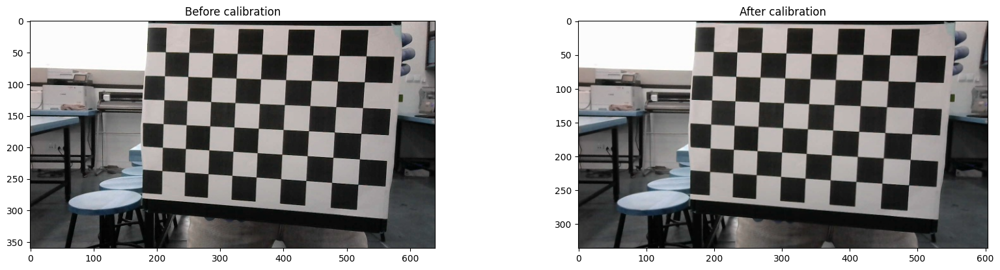

In [3]:
# Show before and after calibration images
fig = plt.figure(figsize = (20, 10))
ax = fig.add_subplot(2, 2, 1); plt.imshow(chess); ax.set_title('Before calibration')
ax = fig.add_subplot(2, 2, 2); plt.imshow(calibrated); ax.set_title('After calibration');

It is clear that the chessboard line in the latter image is straight, which means that we can apply this technique to the lane detection so that the lane is undistorted. However, one side effect is that the new image will be cropped. It means that we must be careful with the dimension of the images as it is different from the original one.

## 2. Lane Marking Detection

For the lane detection, we will follow an approach as below:
- First, calibrate the camera and use the parameters to undistort the image
- Next, apply color filtering on HLS color map and thresholding into black and white
- Then, detect the lane's sourcepoints from B&W image using Houghlines, color peaking, and window sliding
- After that, use sourcepoints to warp image from car view to bird view
- In the bird view image, fit quadratic polynomial curves
- Finally, unwarp the image and use the two curves to determine the midline

The obtained result will be the two curves' coefficients, the midline coordinates, the distance from midpoint to midline, and the lane-projection image.

### 2.1. Undistort Frame

Applying the technique as above, we calibrate the camera and undistort the input lane image.

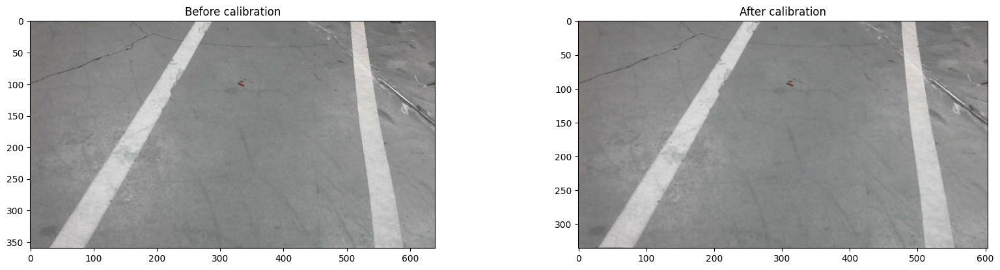

In [4]:
# Read reference image to set up the calibration
lane = cv.imread("./Lane/7.jpg")
lc = Calibration(iframe = lane)

# Undistort frame
lane_undist, _ = lc.undistort(lane)

# Show before and after calibration images
# Display results.
fig = plt.figure(figsize = (20, 10))
ax = fig.add_subplot(2, 2, 1); plt.imshow(lane); ax.set_title('Before calibration')
ax = fig.add_subplot(2, 2, 2); plt.imshow(lane_undist); ax.set_title('After calibration');

As you can see, we have successfully calibrate the camera and undistort the image. Let's move on.

### 2.2 Apply Color and Gradient Thresholding

Integrated in the `LaneFilter()` class.

After undistorting the image, we color- and gradient-thresholded it. For the colored filters, we first convert the image into HLS color map as the lane has very high whiteness and brightness values. Then, we use the Lightness and Saturation color layer as below:

`lane_hls = cv.cvtColor(lane_undist, cv.COLOR_RGB2HLS)`

`lane_l = lane_hls[:, :, 1]`

`lane_s = lane_hls[:, :, 2]`

There will be 2 conditions for the color thresholding.
- The first condition is `lane_s > sat_thresh` and `lane_l > light_thresh` where `SAT` and `light_thresh` are pre-specified.
- The second condition is `lane_l > light_thresh_agr` where `light_thresh_agr >> light_thresh`.

The pixel of the B&W will have a color of `1` if satisfies either conditions or `0` otherwise. 

Then, we applied gradient thresholding using *sobel operator* to the lightness layer. We used kernel of `5`, `x_thresh` of `20`, `mag_thresh` of `40` to weed out locations of gradient that don’t have a large enough change in lightness. We also only consider gradients of a particular orientation. A little above 0 degrees (`0.7` in radians) and below 90 degrees (`1.4` in radians) are the chosen range for `grad_thresh`.

And after trails and errors, we came up with the below thresholding criteria:

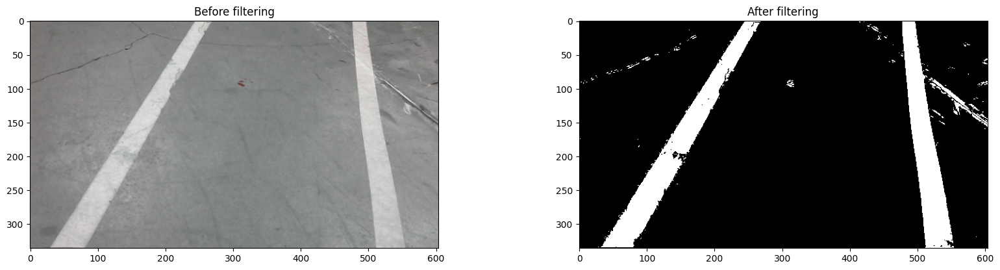

In [5]:
# Set up Lane Filtering
criteria = {'sat_thresh': 120, 'light_thresh': 20, 'light_thresh_agr': 180,
          'grad_thresh': (0.7, 1.4), 'mag_thresh': 40, 'x_thresh': 20}
lf = LaneFilter(criteria)

# Apply color filters
lane_filtered = lf.apply(lane_undist)

# Display results.
fig = plt.figure(figsize = (20, 10))
ax = fig.add_subplot(2, 2, 1); plt.imshow(lane_undist); ax.set_title('Before filtering')
ax = fig.add_subplot(2, 2, 2); plt.imshow(lane_filtered, cmap = "gray"); ax.set_title('After filtering');

Although we were quite successful with the thresholding since the lane is visible, some noises (the transparent tape) were not cancel out. When we tried more parameters, we noticed that we cannot remove all noises as it has random and even more lightness value than our lane. Therefore, we came up with the following algorithm to detect lane.

### 2.3. Detect Lane's Sourcepoints

As said above, we decided not to use traditional Houghline algorithm to detect line due to the extreme noises appeared simutanously in our images. Rather, we will use the combination of *Houghline, peak point, and window sliding* to determine the lane's sourcepoints. 

**Sourcepoints** are defined to be the 2 representative points of a lane as every infinite line can be re-construct using only 2 points. However, our lines is finite, so we will use the top point (having lowest y value) and bottom point (having highest y value) to be a lane's sourcepoints.

#### 2.3.1. Using Houghline
Integrated in the `return_src_pts()` method. This method will be used only for the first video's frame to detect the lane's sourcepoints. This is performed with the assumption that the lane in the first frame has a scale trapezoidal shape. 

Here is the breakdown of that method:

Text(0.5, 1.0, 'Images with all detected lines drawn')

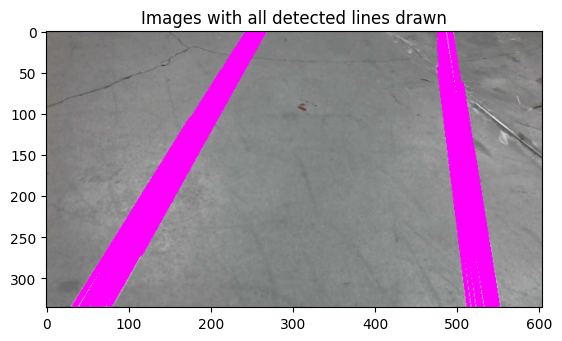

In [6]:
# Set up HoughlinesP and houghing
lines_houghed = sp.houghing(lane_filtered, rho = 1, theta = np.pi / 180,
                         threshold = 100, min_len = 10, max_gap = 50)

# Draw all lines found onto a new image.
hough_lines = hp.draw_line(lane_undist, lines_houghed)

# Display results
plt.imshow(hough_lines); plt.title("Images with all detected lines drawn")

After fitting all lines into the images, we will combine them together to have 2 lines only: one for left and one for right. Based on our previous assumption, we can extract left and right lines using their slopes' sign: positive for left lines and negative for right lines.

Then, we take the average of the positive slopes and negative slopes and use them to determine the sourcepoints.

Left top: [254.   0.], Left bottom: [ 57. 336.]
Right top: [481.   0.], Right bottom: [533. 336.]


Text(0.5, 1.0, 'Extrapolated lanes')

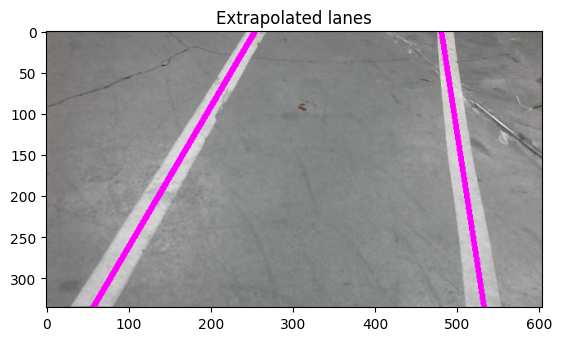

In [7]:
# Extract left and right lines using slopes' sign
lane_left, lane_right = sp.extract_lanes(lane_filtered, lines_houghed)

# Left-top, left-bottom, right-bottom, right-top
source_points = np.array([lane_left[2:], lane_left[0:2], lane_right[0:2], lane_right[2:]], np.float32)
print("Left top: %s, Left bottom: %s" % (source_points[0], source_points[1]))
print("Right top: %s, Right bottom: %s" % (source_points[3], source_points[2]))

# Use sourcepoints draw extrapolated lane on top of the img
extra_lane = hp.draw_lane(lane_undist, source_points.astype(int))
plt.imshow(extra_lane); plt.title("Extrapolated lanes")

However, in case that the first frame cannot be detected, we will use a pre-defined sourcepoints of `[(200, 0), (200, 360), (400, 360), (400, 0)]` *(Left-top, Left-bot, Right-bot, Right-top)* which is the equilibrium sourcepoints optained from trapezoidal roads.

This set of sourcepoints is used to prevent the program from crashing from the very first start and it is also one of the limitations of the algorithm for finding the lanes' starting points.

#### 2.3.2. Using Color Peaking and Window Sliding
Intergrated in the `next_src_pts()` method.

After having the first frame's sourcepoints, we will continuously update the sourcepoints so that the following points will be either one of the previous points' neighborhood or the peaked one. 

For the visualization purpose, let us assume that the below frame is the consecutively next frame of the above frame. We used the saved camera's matrix to undistort the frame, and apply thresholding with the same parameters.

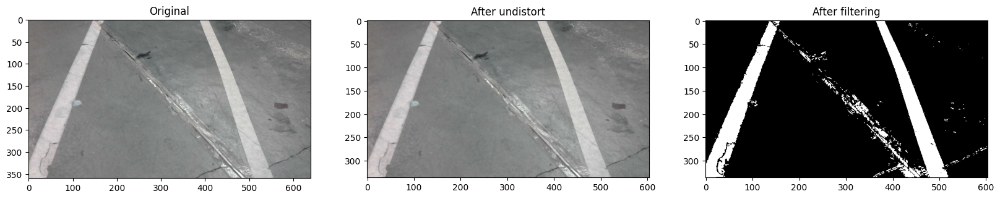

In [8]:
# Read and pre-process the next frame
next_lane = cv.imread("./Lane/9.jpg")            # Read frame
next_lane_undist, _ = lc.undistort(next_lane)    # Undistort
next_lane_filtered = lf.apply(next_lane_undist)  # Threshold

# Display results.
fig = plt.figure(figsize = (20, 10))
ax = fig.add_subplot(2, 3, 1); plt.imshow(next_lane); ax.set_title('Original')
ax = fig.add_subplot(2, 3, 2); plt.imshow(next_lane_undist); ax.set_title('After undistort');
ax = fig.add_subplot(2, 3, 3); plt.imshow(next_lane_filtered, cmap = "gray"); ax.set_title('After filtering');

##### 2.3.2.1. Default Settings
Let us consider the bottom point of the left lane. 

By default, the next frame's sourcepoint will have the coordinates of the previous frame's sourcepoints. This is to make sure that we can always project the lane since it will be less prompt to shaken and bad frames.

Since we must compare between the two algorithm, we chose a fixed window size of `40px x 10px` as we noticed that the lane is roughly 40px wide in the images and 10px depth is ok for shearing.

In [9]:
# Window size
win_size = [40, 10]

For simplicity, let us choose the left-bottom sourcepoint to give example on.

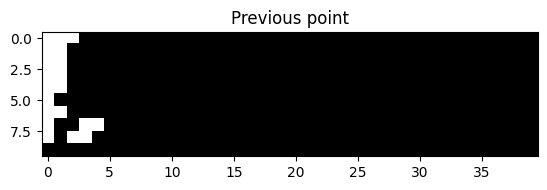

In [10]:
# Crop that region
pre_left_bot = sp.index_frame(next_lane_filtered, int(source_points[1][0]), int(source_points[1][1]), win_size)

# Display the window of next frame with the previous frame's sourcepoints
plt.imshow(pre_left_bot, cmap = "gray"); plt.title('Previous point');

##### 2.3.2.2. Color Peaking
Let us consider the bottom point of the left lane. 

We will consider a slide in the x direction with the y value of the bottom area. Since the lane is whote and other area is grey, our slide will have 2 large peaks in lightness value. Since we are considering the left bottom point, we will take the value of *x* from *0* to *half the image* where the peak happens. That cut in the middle of the image is also based on the assumption of trapezoidal lanes.

In [11]:
# Determine the peak points of the bottom points
cut = [next_lane_filtered.shape[0] - 1, next_lane_filtered.shape[0] + 1]
peak_y_bot = next_lane_filtered.shape[0]
peak_x_left_bot, _ = hp.peak(next_lane_filtered, starting = cut[0], ending = cut[1])

# Print peaked pointed
print([peak_x_left_bot, peak_y_bot])

[0, 336]


Having the sourcepoint's coordinates, we can crop the window with the pre-defined shape where the x coordinate lying in the middle and y coordinate lying in the top. However, to preserve that shape, the y coordinate will lie in the bottom in case of bottom point and x coordinate will lie in the left/right in case of leftmost/rightmost point.

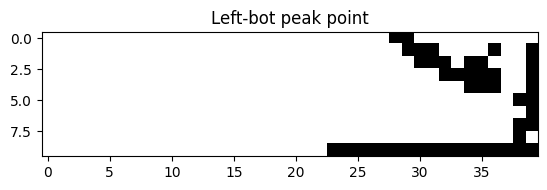

In [12]:
# Crop the peaked region
peak_left_bot = sp.index_frame(next_lane_filtered, peak_x_left_bot, peak_y_bot, win_size)

# Display result
plt.imshow(peak_left_bot, cmap = "gray"); plt.title('Left-bot peak point');

As you can see, the peak window has a lot of `1`-value pixels.

##### 2.3.2.3. Window Sliding
Let us consider the neighbors of the previous's left-bottom point in the new frame.

Similar to the peak approach, the window sliding also moves in 1 direction (x). More specifically, it will consider *n* neighbor points (n/2 left and n/2 right) of the previous point coordinates. This is based on the assumption that the lanes smoothly change. Therefore, number of n determines the threshold of change. If n is small, the detected lane is close to the previous lane and our video will be more smooth. However, our program will not be able to detect dramatic change. If n is large, we can detect large change, yet we fail to provide a smooth transition from previous frame to the next frame.

After trails and errors, we choose `n = 40` as it best-align with our test video. However, in real-life situation, this number must be re-determined. And it is best to let the program self decide it. That means if we have more time, we will write a reinforcement machine learning model to decide the number of neighbor points in real-time.

Text(0.5, 1.0, 'Thirtieth window')

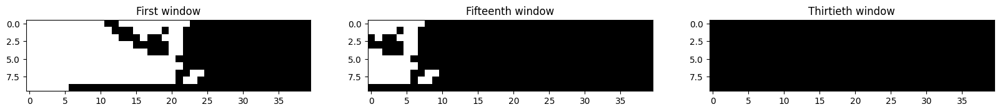

In [13]:
# Consider 40 neighborhood windows in x-direction
all_temps = []
for (x, y, temp_win) in sp.sliding_window(next_lane_filtered, source_points[1], 1, win_size):
    all_temps.append(np.array(temp_win))
    
# Display every 15-th window
fig = plt.figure(figsize = (20, 7))
ax = fig.add_subplot(1, 3, 1); plt.imshow(all_temps[0], cmap = "gray"); ax.set_title('First window')
ax = fig.add_subplot(1, 3, 2); plt.imshow(all_temps[15], cmap = "gray"); ax.set_title('Fifteenth window')
ax = fig.add_subplot(1, 3, 3); plt.imshow(all_temps[30], cmap = "gray"); ax.set_title('Thirtieth window')

##### 2.3.2.4. Weighted Mean Squared Error

After having all these windows, how can we choose the best one? This is the question that we haven't got the best answer for. However, we believed that our attempt using weighted mean squared error is the very close to an optimal metric.

So, we created 3 artifitial window representing a straight lane, a left-sheared lane, and a right-sheared lane as below.

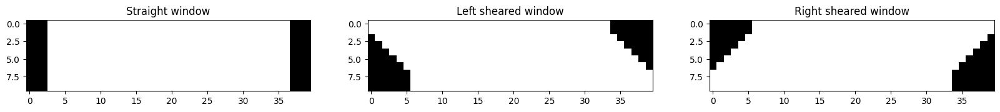

In [14]:
# Border
BORDER = 6
start = int((win_size[1] - BORDER) / 2)
    
# Straight lane
straight = [0] * int(BORDER/2) + [1] * (win_size[0] - BORDER) + [0] * int(BORDER/2)
straight = np.full(win_size[::-1], straight, dtype = int)
    
# Left-shear
left = np.zeros(win_size[::-1], dtype = int)
for i in range(win_size[1]):
    n = 0 if i < start else (BORDER if i > BORDER else i - start + 1)
    left[i] = [0] * n + [1] * (win_size[0] - BORDER) + [0] * (BORDER - n)
    
# Right-shear
right = np.zeros(win_size[::-1], dtype = int)
for i in range(win_size[1]):
    n = 0 if i < start else (BORDER if i > BORDER else i - start + 1)
    right[i] = [0] * (BORDER - n) + [1] * (win_size[0] - BORDER) + [0] * n

# Display artifitial lane windows
fig = plt.figure(figsize = (20, 7))
ax = fig.add_subplot(1, 3, 1); plt.imshow(straight, cmap = "gray"); ax.set_title('Straight window')
ax = fig.add_subplot(1, 3, 2); plt.imshow(left, cmap = "gray"); ax.set_title('Left sheared window');
ax = fig.add_subplot(1, 3, 3); plt.imshow(right, cmap = "gray"); ax.set_title('Right sheared window');

Then, we will calculate the mean square error (mse) of every window with the three artifitial windows above. To avoid prioritization towards straight window (since we must determine the sheared one for turing lane), we will determine the smallest mse among those mses and perform the following calculation:

`final_mse = (s_mse + l_mse + r_mse + w_mse * 2) / 5`

where `s_mse` is straight mse, `l_mse` is left-sheared mse, `r_mse` is right-sheared mse, and `w_mse` is the lowest mse.

As an example, let us show the weighted mse of above windows.

In [15]:
# Calculate the weighted mean squared error for above windows
diff_pre = sp.calc_diff(pre_left_bot)
diff_peak = sp.calc_diff(peak_left_bot)
diff_nei0, diff_nei15, diff_nei30 = sp.calc_diff(all_temps[0]), sp.calc_diff(all_temps[15]), sp.calc_diff(all_temps[30])

# Show results:
print("Previous is %s, peak is %s, and the neighbors are %s, %s, %s, respectively." %
      (diff_pre, diff_peak, diff_nei0, diff_nei15, diff_nei30))

Previous is 0.612, peak is 0.296, and the neighbors are 0.47850000000000004, 0.5925, 0.578, respectively.


It is clear that the peak has the lowest mse, so it is likely that it will be the next bottom-left sourcepoint. In our program, we will let the code automatically select the point having the lowest mse.

### 2.4. Warp Image

Intergrated in the `BirdView()` class.

As said earlier, we will perform curve fitting with 2 degree of freedom to represent a lane. However, curve fitting is prone to noises and we cannot remove all noises in our image. Therefore, we applied a method called warping to minimize the distance in x's direction between all points of a line. As a result, we only need a small region to perform curve fitting, which results in better lane accuracy since the pixels outside of the region are eliminated. 

With that being said, we fixed the new 4 coordinates to be `[(200, 0), (200, 360), (400, 360), (400, 0)]`. This coordinates were chosen randomly and had no effect on the calculation since we would unwarp the image later on. Having these 4 coordinates along with 4 sourcepoints, we applied image warping so that the corresponding coordinates matched.

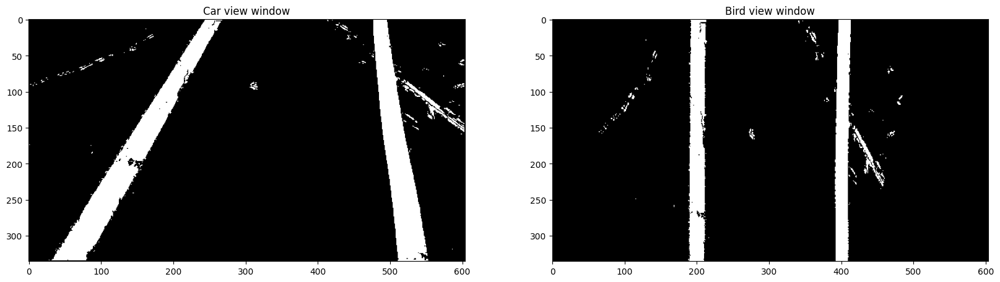

In [16]:
# Set up Bird View
dst_pts = np.array([(200, 0), (200, 360), (400, 360), (400, 0)], np.float32)
bd = BirdView(source_points, dst_pts)
lane_warp = bd.bird_view(lane_filtered)

# Display artifitial lane windows
fig = plt.figure(figsize = (20, 7))
ax = fig.add_subplot(1, 2, 1); plt.imshow(lane_filtered, cmap = "gray"); ax.set_title('Car view window')
ax = fig.add_subplot(1, 2, 2); plt.imshow(lane_warp, cmap = "gray"); ax.set_title('Bird view window');

As you can see, the lanes are parallel. It looks identical to the MakerSpace lane when we look down from the sky.

### 2.5. Fit Quadratic Polynomial Curve to Lane

Intergrated in the `PolyLines()` class.

Having that, we could easily set up the curve fitting algorithm with `9` windows having a small margin of `40` (identical to the lane's width).

In [17]:
# Set up Curving
pl = PolyLines(num_windows = 9, margin = 40, min_px = 50)

Then, we determined the starting points for the fitted curves using the peak algorithm as above. With that, we continuously found the next x-coordinate so as to minimize the total square error. In the end, we fitted the curve into those points and got away with the coefficients of a quadratic polynomial equation.

In [18]:
# Fit polynomial curve
result = pl.return_polylines(lane_warp)

print("Left lane's coeffs:", result["left_lane"])
print("Right lane's coeffs:", result["right_lane"])

Left lane's coeffs: [ 1.91241722e-05 -1.17758423e-02  2.01309661e+02]
Right lane's coeffs: [-1.35136503e-04  4.59264467e-02  3.98387039e+02]


Then, we used those coefficients to drawn the line onto the warpped image. This can be easily done by using a for-loop of y and calculate x with respect to y using `x = coeff[0] * (y ** 2) + coeff[1] * y + coeff[2]`.

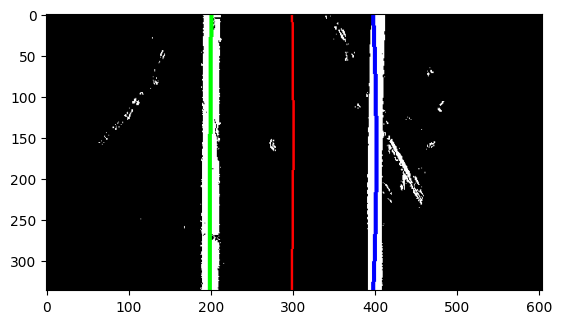

In [19]:
# Display warped view with quadratic polynomial lane and midline
plt.imshow(result['image'])

As you can see, the curves are fit perfectly into the lane. Although the right line are quite shifted because of the noises, our result is much better than that of the original method.

### 2.6. Unwarp the Image

Intergrated in the `BirdView()` class.

Since we have the transformation matrix to warp car view image to sky view image, we also have its inverse matrix. And by applying the inverse transformation matrix to the sky view image, we get back the car view image, with lane drawn onto.

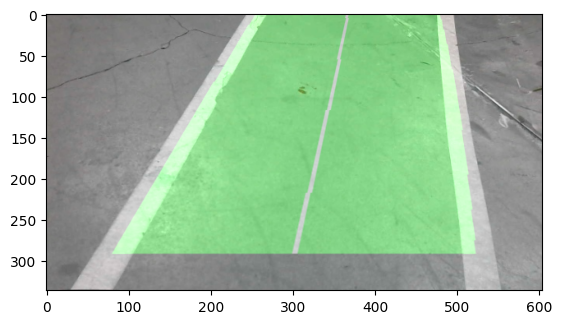

In [20]:
lane_projected = bd.project(lane_undist, lane_filtered, result['left_lane'], result['right_lane'], result['midpoints'])
plt.imshow(lane_projected)

As you can see, the unwarp works well. There is only one problem: the drawing lane is not infinite. Therefore, when we apply the drawn lane onto the unwarpped image, there are some regions not drawn. We decided to left it out and measured the distance from the camera to the beginning of the detected lane as below.

### 2.7. Calculate the Midpoint

Intergrated in the `PolyLines()` class.

First, we came up with the method as illustrated below:

<img src="img/2.png" width = 360 height = 640 />

where `x` is the distance from midline -> center point, `L = 50mm` is the ground-projected distance from camera to middle point of the detected lane's bottom line, and `beta` is the degree of the slope and the horizontal line.

And to convert from px to mm, we can use the formula `f(x) = x * sensor_width / img_width * warp_ratio` with `warp_ratio = distance(car_view_point) / distance(bird_view_point)` to undo the warping value.

In [21]:
# Calculate the angle between the midline and the horizontal line
slope = bd.calc_slope(lane_undist, result['midpoints'])
alpha = math.atan(slope)

# Calculate distance and convert from px to mm
cot_alpha = math.cos(alpha) / math.sin(alpha) if alpha != 0 else 0
warp_ratio = (source_points[2][0] - source_points[1][0]) / (dst_pts[2][0] - dst_pts[1][0])
actual_distance = result["position"] * 3.84 / 640  * warp_ratio + cot_alpha * 50  # L is 50
print(actual_distance, "mm")

-4200.042311821077 mm


The result shocked us as it is extremely far from the true value. We looked back at the code and believed that it was alpha angle that resposible for this error. Somehow when we tried to convert curve into line and calculate its slope, that angle is unreliable. 

Therefore, we tried a different method as below.

<img src="img/3.png" width = 640 height = 360 />

where `x` is the distance from midline -> center point, `d = 370mm` is the bird's distance between camera and the middle point of the detected lane's bottom line, and `f` is focal length.

In [22]:
# Initialize
y, width = lane_warp.shape[0], lane_warp.shape[1]
kl, kr = result["left_lane"], result["right_lane"]

# Calculate distance from midline -> center point
xl = kl[0] * (y ** 2) + kl[1] * y + kl[2]
xr = kr[0] * (y ** 2) + kr[1] * y + kr[2]
position = xl + (xr - xl) / 2
relative_position = (position - width / 2)

# Calculate distance and convert from px to mm
warp_ratio = (source_points[2][0] - source_points[1][0]) / (dst_pts[2][0] - dst_pts[1][0])
mid_dist_mm = relative_position * 3.58 / 640 * warp_ratio
actual_distance = mid_dist_mm * 370 / 4.046
print(actual_distance, "mm")

-3.6073590041175954 mm


As you can see, this method is more accurate. Although it is not near our measurement (2cm), it was the best that we could do.

## 3. Robot Deployment

Intergrated in the `main.py` program.

In [23]:
def projection(iframe, pre_windows = None, last_pt = None):
    """ Read, segment, and project the lane onto the input frame."""
    # Apply color filters
    undist, _ = cc.undistort(iframe)
    filtered = lf.apply(undist)

    # Find starting and ending points of the lanes
    first_time = (pre_windows is None) or (last_pt is None)
    src_pts = return_src_pts(undist) if first_time else next_src_pts(filtered, last_pt, win_size = [40, 10])
    dst_pts = np.array([(200, 0), (200, 360), (400, 360), (400, 0)], np.float32)
    windows = return_windows(filtered, src_pts, win = [40, 10])
    
    # Set up Bird View
    bd = BirdView(src_pts, dst_pts)
    bird = bd.bird_view(filtered)
    
    # Project the result to the undistorted frame
    result = pl.return_polylines(bird)
    projected = bd.project(undist, filtered, result['left_lane'], result['right_lane'], result['midpoints'])

    # Calculate distance
    warp_ratio = (src_pts[2][0] - src_pts[1][0]) / (dst_pts[2][0] - dst_pts[1][0])
    width_cm = round(px_to_mm(result["lane"], iframe.shape[:2][::-1], warp_ratio,
                             focal = cc.focal_length()) / 10, 2)
    pos_cm = round(px_to_mm(result["position"], iframe.shape[:2][::-1], warp_ratio,
                            focal = cc.focal_length()) / 10, 2)
    direction = "right " if pos_cm > 0 else "left "
    
    text_pos = "Camera: " + direction + str(abs(pos_cm)) + " cm"
    text_lane = "Lane width: " + str(width_cm) + " cm"
    cv.putText(projected, text_pos, (10, 30), cv.FONT_HERSHEY_COMPLEX, 0.7, (0, 0, 0), 1)
    cv.putText(projected, text_lane, (10, 60), cv.FONT_HERSHEY_COMPLEX, 0.7, (0, 0, 0), 1)

    return projected, windows, src_pts, result['image'], filtered

## 4. Calculate Lane Width

Intergrated in the `PolyLines()` class.

This is quite the same as calculating the midpoint. However, we will try to calculate and average the lane width at every value of y.

In [24]:
# Average the lane width for all ys
widths = []
kl, kr = result["left_lane"], result["right_lane"]

for y in range(lane_warp.shape[0]):
    xl = kl[0] * (y ** 2) + kl[1] * y + kl[2]
    xr = kr[0] * (y ** 2) + kr[1] * y + kr[2]
    widths.append(abs(xr - xl))
    
lane_width = np.average(widths)
print(lane_width, "mm")

200.96326427814836 mm


This is quite close to the real data. As we measured, the average lane region is about 22cm wide. However, in that particular spot, the lane is 20cm wide. Knowing that, we decided to only use the lane width at the bottom of the lane. The revised method is as below:

In [25]:
# Calculate the lane width at y = 360 only
y = lane_warp.shape[0]
kl, kr = result["left_lane"], result["right_lane"]

xl = kl[0] * (y ** 2) + kl[1] * y + kl[2]
xr = kr[0] * (y ** 2) + kr[1] * y + kr[2]
    
lane_width = abs(xr - xl)
print(lane_width, "mm")

199.0499344370186 mm


Although this new number has the same error as the previous one, we believe that this will less prone to miscalculation. This is because the points at the top are more distorted than the one near the camera due to dramatically lane change and mix lighting condition.

## 5. Final Results

In this section, we will show the results on image and video, along with providing the method to debug the program.

### 5.1. Debug Methods

For the purpose of demonstrating, we will use this test method to showcase the lane detection algorithm.

The test method takes in the path of an image, the image is then passed through our program just like how each frame is processed when processing a video and returns each step's results.

In [26]:
def test_helper(img):
    """ Helper method for test()."""
    # Apply color filters
    ground_img, _ = cc.undistort(img)
    binary_img = lf.apply(ground_img)
    
    # Set up main method
    src_pts = return_src_pts(ground_img)
    dst_pts = np.array([(150, 0), (150, 360), (450, 360), (450, 0)], np.float32)
    bd = BirdView(src_pts, dst_pts)
    birdseye_img = bd.bird_view(binary_img)
    
    # Fit curves
    result = pl.return_polylines(birdseye_img)
    left_curve = result['left_lane']
    right_curve = result['right_lane']
    curve_debug_img = result['image']
    
    # Project the result to the undistorted frame
    projected_img = bd.project(ground_img, binary_img, left_curve, right_curve, result['midpoints'])
    
    # Calculate distance
    warp_ratio = (src_pts[2][0] - src_pts[1][0]) / (dst_pts[2][0] - dst_pts[1][0])
    width_cm = round(px_to_mm(result["lane"], img.shape[:2][::-1], warp_ratio,
                             focal = cc.focal_length()) / 10, 2)
    pos_cm = round(px_to_mm(result["position"], img.shape[:2][::-1], warp_ratio,
                            focal = cc.focal_length()) / 10, 2)
    direction = "right " if pos_cm > 0 else "left "
    
    text_pos = "Camera: " + direction + str(abs(pos_cm)) + " cm"
    text_lane = "Lane width: " + str(width_cm) + " cm"
    cv.putText(projected_img, text_pos, (10, 30), cv.FONT_HERSHEY_COMPLEX, 0.7, (0, 0, 0), 1)
    cv.putText(projected_img, text_lane, (10, 60), cv.FONT_HERSHEY_COMPLEX, 0.7, (0, 0, 0), 1)
    
    return birdseye_img, binary_img, curve_debug_img, projected_img

def test(path):
    """ Debug tool for projection()."""
    img = cv.imread(path)
    birdseye_img, binary_img, curve_debug_img, projected_img = test_helper(img)
    
    # Display results.
    fig = plt.figure(figsize = (20, 10))
    ax = fig.add_subplot(1, 4, 1); plt.imshow(binary_img, cmap = "gray"); ax.set_title('Filtering');
    ax = fig.add_subplot(1, 4, 2); plt.imshow(birdseye_img, cmap = "gray"); ax.set_title('Bird eye')
    ax = fig.add_subplot(1, 4, 3); plt.imshow(curve_debug_img); ax.set_title('Curving')
    ax = fig.add_subplot(1, 4, 4); plt.imshow(projected_img); ax.set_title('Projection');
    
    plt.show()

### 5.2. Detect Lane from Images

In this section, we will show how our programs work on the rest images in the `./Lane` folder.

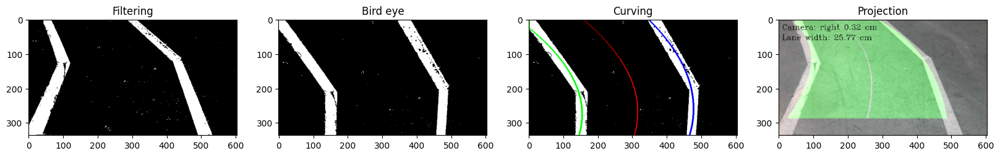

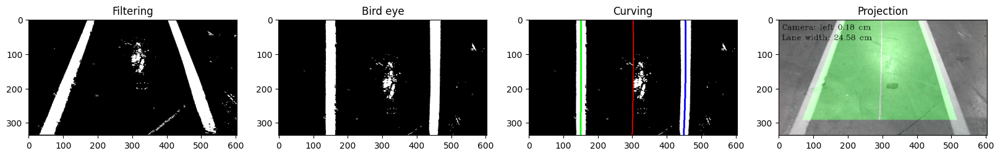

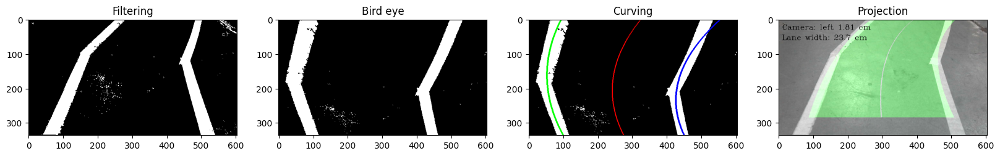

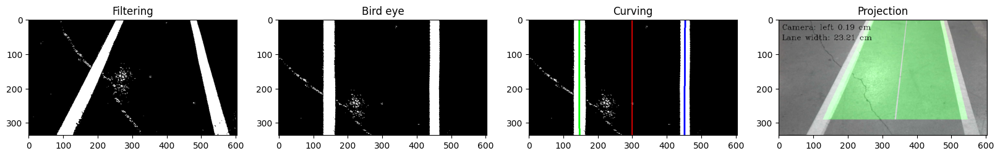

In [27]:
# Individually process each lane image
test("./Lane/8.jpg")
test("./Lane/10.jpg")
test("./Lane/11.jpg")
test("./Lane/12.jpg")

### 5.3. Detect Lanes from Video

In this section, we will will show how our programs work on the video recorded at MakerSpace.

#### 5.3.1. A Random Frame

wait for video read


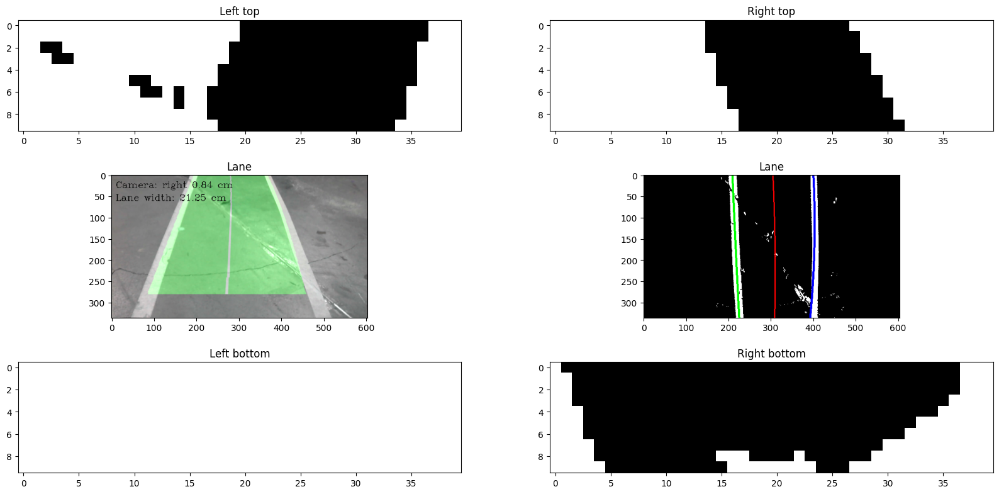

In [28]:
# Testing frame 270 from a video
path_vid = "./Lane/lane3.mp4"
cap = cv.VideoCapture(path_vid)
if not cap.isOpened():
    print("error reading")

print("wait for video read")

window, pts, filtered = None, None, None
        
for time in range(29 * 30):
    ret, frame = cap.read()
    frame = cv.resize(frame, (640, 360))
    new_frame, window, pts, bird, filtered = projection(frame, window, pts)
cap.release()
cv.destroyAllWindows()
    
# Display results.
fig = plt.figure(figsize = (20, 10))

ax = fig.add_subplot(3, 2, 1); plt.imshow(window[0], cmap = 'Greys'); ax.set_title('Left top');
ax = fig.add_subplot(3, 2, 2); plt.imshow(window[3], cmap = 'Greys'); ax.set_title('Right top');
ax = fig.add_subplot(3, 2, 3); plt.imshow(new_frame); ax.set_title('Lane')
ax = fig.add_subplot(3, 2, 4); plt.imshow(bird); ax.set_title('Lane')
ax = fig.add_subplot(3, 2, 5); plt.imshow(window[1], cmap = 'Greys'); ax.set_title('Left bottom');
ax = fig.add_subplot(3, 2, 6); plt.imshow(window[2], cmap = 'Greys'); ax.set_title('Right bottom');
plt.show()

#### 5.3.2. The Whole Video

Intergrated in the `main_video.py` program, the code program takes in an example footage of the car's view when travelling across the track and process the each frame with lane detection, lane width, distance from midline. Subsequently, the processed information of the video will be recorded and saved to a new video in a separate folder. 

For real robot car deployment, we prepared `main.py` that takes in the camera input and process the same operations as mentioned above. However, this program will only display the processed information on the screen and does not record or write into a video. 

In [29]:
# Read reference image to set up the calibration
img = cv.imread("./Lane/7.jpg")
Cali = Calibration(iframe = img)

# Set up Lane Filtering
params = {'sat_thresh': 120, 'light_thresh': 20, 'light_thresh_agr': 180, 'grad_thresh': (0.7, 1.4), 'mag_thresh': 40, 'x_thresh': 20}
Lane = LaneFilter(params)

# Set up Curving
Poly = PolyLines(num_windows = 9, margin = 35, min_px = 50)

# Read and write video
path_vid = "./Lane/lane3.mp4"
cap = cv.VideoCapture(path_vid)
frame_count = int(cap.get(cv.CAP_PROP_FRAME_COUNT))
frame_fps = int(cap.get(cv.CAP_PROP_FPS))
FRAME_RESO = (604, 336)
VIDEO_CODEC = 'mp4v'
vid_out = cv.VideoWriter("./Outputs/tmp_output.mp4", cv.VideoWriter_fourcc(*VIDEO_CODEC), frame_fps, FRAME_RESO)
print(f'Height {FRAME_RESO[1]}, Width {FRAME_RESO[0]}')
print(f'FPS : {frame_fps:0.2f}, Frames: {frame_count}')

if not cap.isOpened():
    print("error reading")

window, pts = None, None
for frame in tqdm(range(frame_count), total = frame_count):
    ret, img = cap.read()
    if ret == False:
        break
    img = cv.resize(img, (640, 360))
    new_frame, window, pts, bird, filtered = projection(img, window, pts)
    vid_out.write(new_frame)
print("done")
print(new_frame.shape)

# Realese everything when done
cap.release()
vid_out.release()
cv.destroyAllWindows()

Height 336, Width 604
FPS : 29.00, Frames: 1329


100%|███████████████████████████████████████| 1329/1329 [00:38<00:00, 34.59it/s]

done
(336, 604, 3)


In [1]:
# Display the saved video file.
from moviepy.editor import *
clip = VideoFileClip("./Outputs/tmp_output.mp4")
clip.ipython_display(width = 800)

Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


## 6. Evaluations on real time deployment.

In this section, we will briefly discuss the results above with respect to the deployment of our program on single board computers and possible optimizations that can be implemented to improve the computational speed.

In our test sample above, the video was recorded in 29 FPS, at full camera resolution (1280x720), with a total of 1329 frames. By the time this report is being written, we ran the code on a 4-core, 3GHz laptop CPU and used the `tqdm` library above to record how fast the CPU can iterate over the frames. The result is approximately 34 iterations/s, which equates to 34 FPS in real time. This means that the laptop CPU can comfortably handle a 30 FPS input.

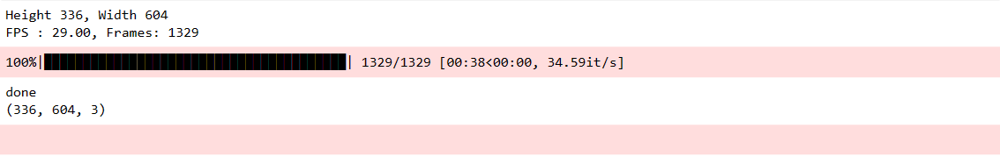

However, to reach this processing speed, we down-scaled the input resolution by half (640x360). Although, this method has been an improvement in speed compared to the full 720p resolution, which is only 20 FPS, it requires calibrating the camera to both resolutions similar to the beginning of this notebook to get the focal length and the error of the camera.

On single board computer deployment, (e.g. [raspberry pi 4 with 4-core, 1.8GHz CPU](https://www.raspberrypi.com/products/raspberry-pi-4-model-b/specifications/)), we can expect the performance to be about half of the laptop (worst case scenario). Since our group was not able to setup the single board computer, we can only estimate that the processing speed for 360p is around 17 FPS. This processing speed might not be ideal since the robot car movement speed might be faster than the algorithm processing speed.

In this case, we recommend further down-scale the resolution of the input to (426x240) or (320x180) and calibrate the camera to these resolutions before running the main program. This resolution will keep the equivalent 16:9 aspect ratio of the camera and is expected to reduce the copmutational load on the single board computer.